Apply Sobel operator to find lines on picture

In [1]:
import os
import cv2
import pickle
import matplotlib.image as mpimg

project_dir = os.path.dirname(os.getcwd())
test_folder_path = os.path.join(project_dir, 'test_images')
output_folder_path = os.path.join(project_dir, 'output_images')

pickle_path = os.path.join(project_dir, 'dist_pickle.p')
dist_pickle = pickle.load(open(pickle_path, "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

def undistort_image(image_name):
    img = mpimg.imread(image_name)
    return img, cv2.undistort(img, mtx, dist, None, mtx)

In [2]:
import numpy as np
import cv2

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    abs_sobel = np.absolute(sobel)
    # scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # create a binary mask where the scaled gradient magnitude thresholds are met
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel > thresh[0]) & (scaled_sobel < thresh[1])] = 1    
    return sobel_binary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # calculate the magnitude 
    magnitude = np.sqrt(sobelx**2+sobely**2)
    # scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*magnitude/np.max(magnitude))
    # create a binary mask where mag thresholds are met
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel > mag_thresh[0]) & (scaled_sobel < mag_thresh[1])] = 1
    
    return sobel_binary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # calculate the direction of the gradient
    directions = np.arctan2(abs_sobely, abs_sobelx)
    # create a binary mask where direction thresholds are met
    sobel_binary = np.zeros_like(directions)
    sobel_binary[(directions > thresh[0]) & (directions < thresh[1])] = 1
    
    return sobel_binary

In [19]:
K_SIZE = 5

def get_sobel_threshold(undistorted):
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(undistorted, orient='x', sobel_kernel=K_SIZE, thresh=(40, 100))
    grady = abs_sobel_thresh(undistorted, orient='y', sobel_kernel=K_SIZE, thresh=(40, 100))
    mag_binary = mag_thresh(undistorted, sobel_kernel=K_SIZE, mag_thresh=(40, 100))
    dir_binary = dir_threshold(undistorted, sobel_kernel=K_SIZE, thresh=(0.6, 1.3))
    
    new_image = np.zeros_like(dir_binary)
    new_image[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return new_image

def get_hsv_threshold(undistorted, v_thresh=(220, 255)):
    hsv = cv2.cvtColor(undistorted, cv2.COLOR_RGB2HSV).astype(np.float)
    v_channel = hsv[:,:,2]
    
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= v_thresh[0]) & (v_channel <= v_thresh[1])] = 1
    return v_binary

def get_hls_threshold(undistorted, s_thresh=(220, 255), sx_thresh=(40, 60)):
    hls = cv2.cvtColor(undistorted, cv2.COLOR_RGB2HLS).astype(np.float)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    binary = np.zeros_like(s_channel)
    binary[((s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])) | (scaled_sobel > sx_thresh[0]) & (scaled_sobel < sx_thresh[1])] = 1
    
    return binary

def threshold_image(image):
    hsv_image = get_hsv_threshold(image)
    hsl_image = get_hls_threshold(image)
    
    new_binary_image = np.zeros_like(hsv_image)
    new_binary_image[(hsv_image==1) | (hsl_image==1)] = 1
    return hsv_image, hsl_image, new_binary_image

C:\Users\Alena\Anaconda3\envs\IntroToTensorFlow\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


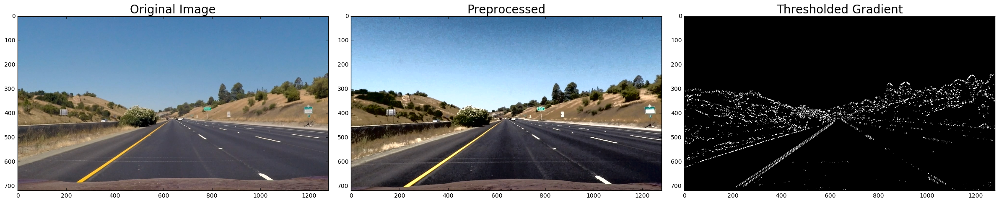

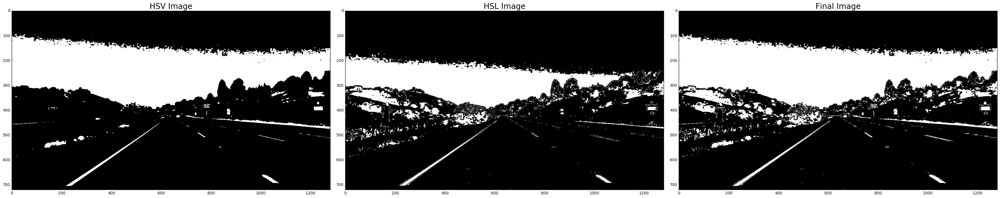

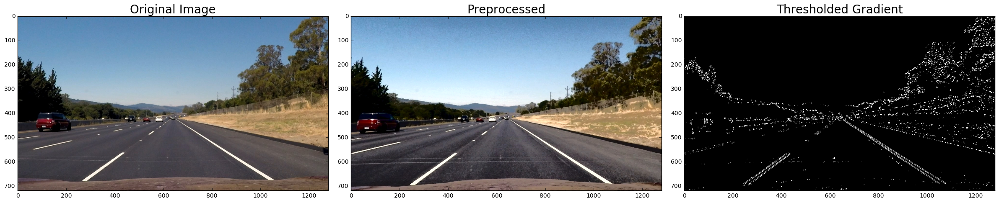

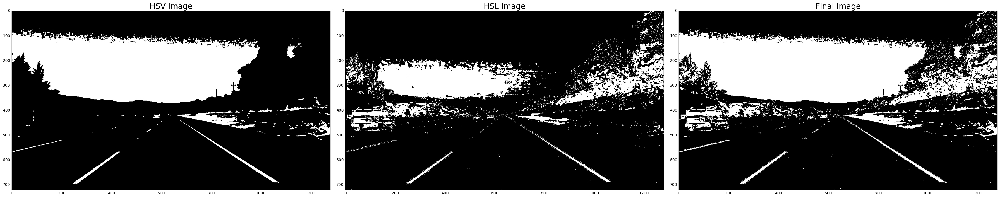

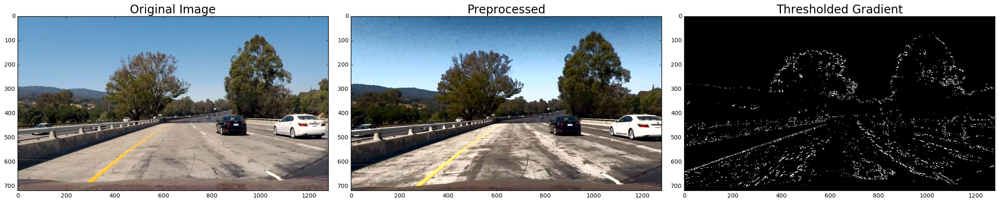

...

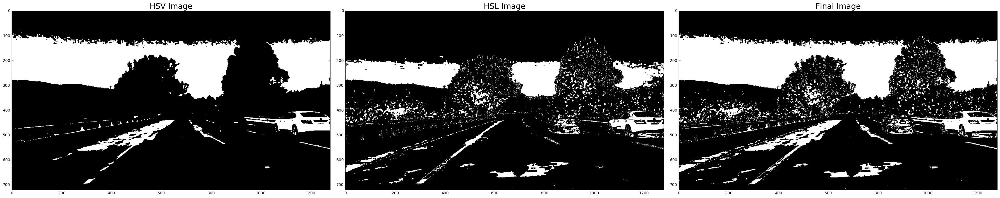

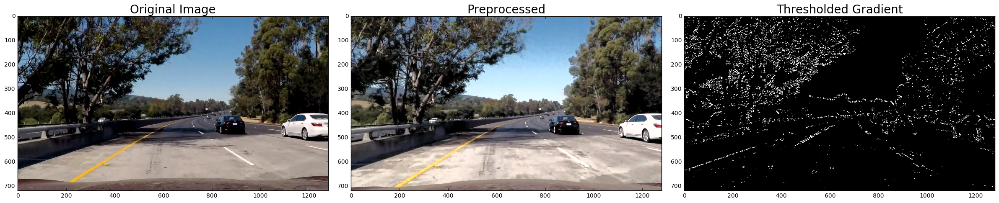

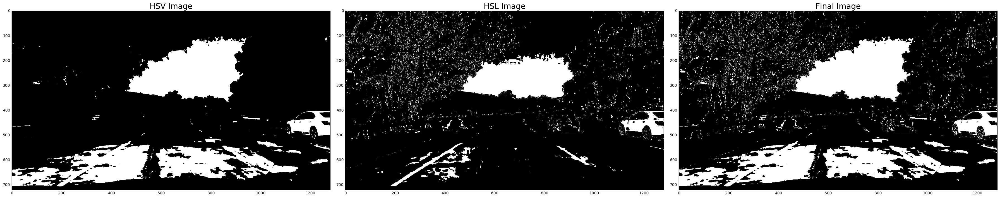

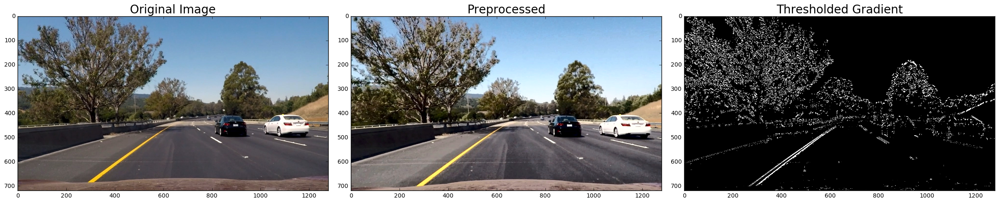

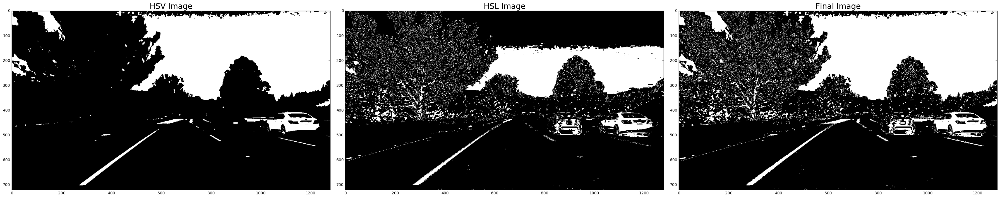

In [20]:
import os
import glob
import matplotlib.pyplot as plt
%matplotlib inline

image_pattern = os.path.join(test_folder_path, '*.jpg')
images = glob.glob(image_pattern)

BLUR_KERNEL = 3

def apply_CLACHE(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    
    cl = cv2.equalizeHist(l)
    
    limg = cv2.merge((cl,a,b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

def select_lines(img_name):
    image_path = os.path.join(test_folder_path, img_name)
    image, undistorted = undistort_image(image_path)
    
    cl = apply_CLACHE(undistorted)
    blured = cv2.GaussianBlur(cl,(BLUR_KERNEL,BLUR_KERNEL),0)
    
    sobel_image = get_sobel_threshold(blured)
    hsv_image, hsl_image, new_binary_image = threshold_image(blured)
    
    output_image_path = os.path.join(output_folder_path, 'sobel_'+img_name)
    mpimg.imsave(output_image_path, new_binary_image, cmap='gray')   

    # Plot the result
    plt.figure()
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(cl)
    ax2.set_title('Preprocessed', fontsize=20)
    ax3.imshow(sobel_image, cmap='gray')
    ax3.set_title('Thresholded Gradient', fontsize=20)
    
    f, (ax4, ax5, ax6) = plt.subplots(1, 3, figsize=(36, 9))
    f.tight_layout()
    ax4.imshow(hsv_image, cmap='gray')
    ax4.set_title('HSV Image', fontsize=20)
    ax5.imshow(hsl_image, cmap='gray')
    ax5.set_title('HSL Image', fontsize=20)
    ax6.imshow(new_binary_image, cmap='gray')
    ax6.set_title('Final Image', fontsize=20)
    
    
for name in images:
    select_lines(os.path.basename(name))